In [1]:
import numpy as np
import cv2

In [2]:
def imregionalmax(image, kernel=None):
    """Find the regional max of the image. An approximation of MATLAB's
    imregionalmax function. Result only differs when surrounding pixels
    have the same value as the center.

    Parameters:
    - image: the input image
    - kernel: the size of the neiborhood region, default is 3x3, i.e.
              neighboring 8 pixels.
    Returns:
    - a bitmask image, where '1' indicates local maxima.
    Author:
    - Yu Fang
    References:
    - https://github.com/bhardwajvijay/Utils/blob/master/utils.cpp
    - https://stackoverflow.com/questions/5550290/find-local-maxima-in-grayscale-image-using-opencv
    """
    # dialate the image so that small values are replaced by local max
    local_max = cv2.dilate(image, kernel)
    # non-local max pixels (excluding pixel w/ constant 3x3 neighborhood)
    # will be replaced by local max, so the values will increase. remove them.
    # so the result is either local max or constant neighborhood.
    max_mask = image >= local_max
    # erode the image so that high values are replaced by local min
    local_min = cv2.erode(image, kernel)
    # only local min pixels and pixels w/ constant 3x3 neighborhood
    # will stay the same, otherwise pixels will be replaced by the local
    # min and become smaller. We only take non-local min, non-constant values.
    min_mask = image > local_min
    # boolean logic hack
    #   (local max || constant) && (!local min && !constant)
    # = local max && !local min && !constant
    # = local max && !constant
    return (max_mask & min_mask).astype(np.uint8)

In [3]:
def est_homography(src, dest):
    """ Compute the homography matrix from (x_src, y_src) to (x_dest, y_dest).
    Parameters:
    - src: (x,y) coordinates of N source pixels, where coordinates are row vectors,
           so the matrix has dimension Nx2 (N>=4).
    - dest: (x,y) coordinates of N destination pixels, where coordinates are row vectors,
            so the matrix has dimension Nx2 (N>=4).
    Returns:
    - the homography matrix such that H @ [x_src, y_src, 1].T = [x_dest, y_dest, 1].T
    Author:
    - Yu Fang
    """
    N = src.shape[0]
    if N != dest.shape[0]:
        raise ValueError("src and diff should have the same dimension")
    src_h = np.hstack((src, np.ones((N, 1))))
    A = np.array([np.block([[src_h[n], np.zeros(3), -dest[n, 0] * src_h[n]],
                            [np.zeros(3), src_h[n], -dest[n, 1] * src_h[n]]])
                  for n in range(N)]).reshape(2 * N, 9)
    [_, _, V] = np.linalg.svd(A)
    # take the right singular vector x corresponding to the least singular value
    # s.t. ||Ax - 0||^2 is minimized
    return V.T[:, 8].reshape(3, 3)

In [4]:
def apply_homography(H, src):
    """ Apply the homography H to src
    Parameters:
    - H: the 3x3 homography matrix
    - src: (x,y) coordinates of N source pixels, where coordinates are row vectors,
           so the matrix has dimension Nx2 (N>=4).
    Returns:
    - src: (x,y) coordinates of N destination pixels, where coordinates are row vectors,
           so the matrix has dimension Nx2 (N>=4).
    Author:
    - Yu Fang
    """
    src_h = np.hstack((src, np.ones((src.shape[0], 1))))
    dest =  src_h @ H.T
    return (dest / dest[:,[2]])[:,0:2]

In [5]:
def drawMatches(image1, kp1, image2, kp2, idx_pairs):
    """A wrapper around OpenCV's drawMatches.
    
    Parameters:
    - image1: the first image
    - kp1: *matrix indices* of the keypoints from image 1
           (Nx2 numpy array, where N is the number of keypoints)
    - image2: the second image
    - kp2: *matrix indices* of the keypoints from image 2 
           (Nx2 numpy array, where N is the number of keypoints)
    - idx_pairs: pairs of matching indices, e.g. if kp1[3] 
                 matches kp2[5], then idx_pairs=[[3,5],...]
                 (Kx2 numpy array, where K is the number of matches)
    Returns:
    - an image showing matching points
    Author:
    - Yu Fang
    """
    # note that the coordinates are reversed because the difference
    # between matrix indexing & coordinates.
    keypt1 = [cv2.KeyPoint(coord[1], coord[0], 40) for coord in kp1.tolist()]
    keypt2 = [cv2.KeyPoint(coord[1], coord[0], 40) for coord in kp2.tolist()]
    matches = [cv2.DMatch(pair[0], pair[1], 0) for pair in idx_pairs.tolist()]
    return cv2.drawMatches(image1, keypt1, image2, keypt2, matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

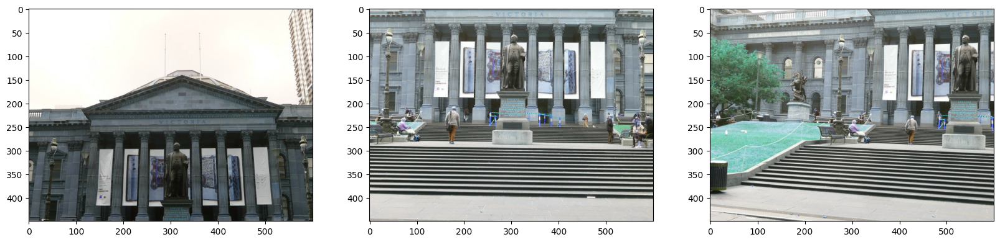

In [6]:
# load the images from set 1
import matplotlib.pyplot as plt

# load image set 1
set1_image1 = cv2.imread("../images/set1/1.jpg")
set1_image2 = cv2.imread("../images/set1/2.jpg")
set1_image3 = cv2.imread("../images/set1/3.jpg")
set1 = [set1_image1, set1_image2, set1_image3]

# convert to grayscale
set1_gray1 = cv2.cvtColor(set1_image1,cv2.COLOR_BGR2GRAY)
set1_gray2 = cv2.cvtColor(set1_image2,cv2.COLOR_BGR2GRAY)
set1_gray3 = cv2.cvtColor(set1_image3,cv2.COLOR_BGR2GRAY)
set1_gray = [set1_gray1, set1_gray2, set1_gray3]

# load image set 2
set2_image1 = cv2.imread("../images/set2/1.jpg")
set2_image2 = cv2.imread("../images/set2/2.jpg")
set2_image3 = cv2.imread("../images/set2/3.jpg")
set2 = [set2_image1, set2_image2, set2_image3]

# convert to grayscale
set2_gray1 = cv2.cvtColor(set2_image1,cv2.COLOR_BGR2GRAY)
set2_gray2 = cv2.cvtColor(set2_image2,cv2.COLOR_BGR2GRAY)
set2_gray3 = cv2.cvtColor(set2_image3,cv2.COLOR_BGR2GRAY)
set2_gray = [set2_gray1, set2_gray2, set2_gray3]

# load image set 3
set3_image1 = cv2.imread("../images/set3/1.jpg")
set3_image2 = cv2.imread("../images/set3/2.jpg")
set3_image3 = cv2.imread("../images/set3/3.jpg")
set3_image4 = cv2.imread("../images/set3/4.jpg")
set3 = [set3_image1, set3_image2, set3_image3, set3_image4]

# convert to grayscale
set3_gray1 = cv2.cvtColor(set3_image1,cv2.COLOR_BGR2GRAY)
set3_gray2 = cv2.cvtColor(set3_image2,cv2.COLOR_BGR2GRAY)
set3_gray3 = cv2.cvtColor(set3_image3,cv2.COLOR_BGR2GRAY)
set3_gray4 = cv2.cvtColor(set3_image4,cv2.COLOR_BGR2GRAY)
set3_gray = [set3_gray1, set3_gray2, set3_gray3, set3_gray4]

# load custom set 1
custom1_image1 = cv2.imread("../images/custom1/1.jpg")
custom1_image2 = cv2.imread("../images/custom1/2.jpg")
custom1_image3 = cv2.imread("../images/custom1/3.jpg")
custom1 = [custom1_image1, custom1_image2, custom1_image3]

# convert to grayscale
custom1_gray1 = cv2.cvtColor(custom1_image1,cv2.COLOR_BGR2GRAY)
custom1_gray2 = cv2.cvtColor(custom1_image2,cv2.COLOR_BGR2GRAY)
custom1_gray3 = cv2.cvtColor(custom1_image3,cv2.COLOR_BGR2GRAY)
custom1_gray = [custom1_gray1, custom1_gray2, custom1_gray3]

# load custom set 2
custom2_image1 = cv2.imread("../images/custom2/1.jpg")
custom2_image2 = cv2.imread("../images/custom2/2.jpg")
custom2_image3 = cv2.imread("../images/custom2/3.jpg")
custom2 = [custom2_image1, custom2_image2, custom2_image3]

# convert to grayscale
custom2_gray1 = cv2.cvtColor(custom2_image1,cv2.COLOR_BGR2GRAY)
custom2_gray2 = cv2.cvtColor(custom2_image2,cv2.COLOR_BGR2GRAY)
custom2_gray3 = cv2.cvtColor(custom2_image3,cv2.COLOR_BGR2GRAY)
custom2_gray = [custom2_gray1, custom2_gray2, custom2_gray3]

# plot set 1
fig, axes = plt.subplots(1, 3,figsize=(20, 20))
axes[0].imshow(set1_image1)
axes[1].imshow(set1_image2)
axes[2].imshow(set1_image3)

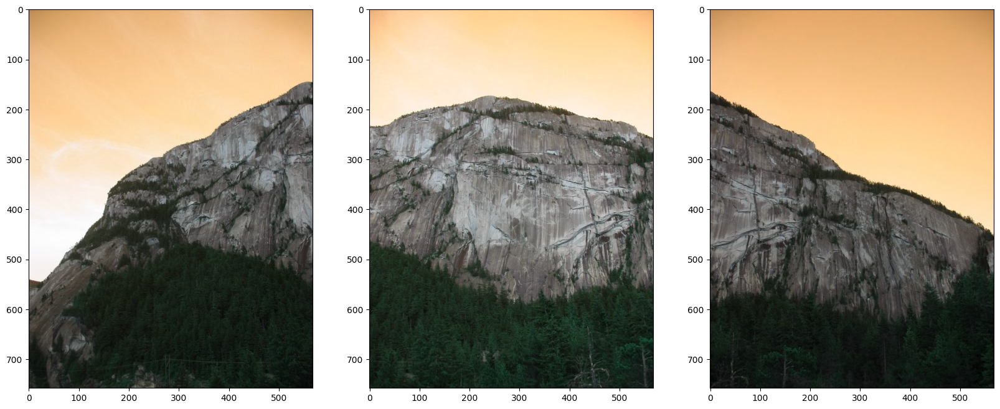

In [7]:
# plot set 2
fig, axes = plt.subplots(1, 3,figsize=(20, 20))
axes[0].imshow(set2_image1)
axes[1].imshow(set2_image2)
axes[2].imshow(set2_image3)

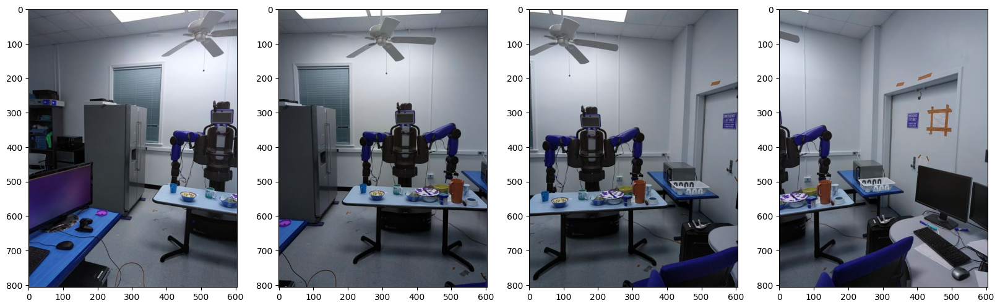

In [8]:
# plot set 3
fig, axes = plt.subplots(1, 4,figsize=(20, 20))
axes[0].imshow(set3_image1)
axes[1].imshow(set3_image2)
axes[2].imshow(set3_image3)
axes[3].imshow(set3_image4)

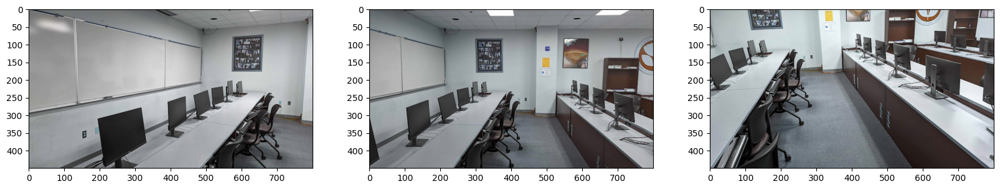

In [9]:
# plot custom set 1
fig, axes = plt.subplots(1, 3,figsize=(20, 20))
axes[0].imshow(custom1_image1)
axes[1].imshow(custom1_image2)
axes[2].imshow(custom1_image3)

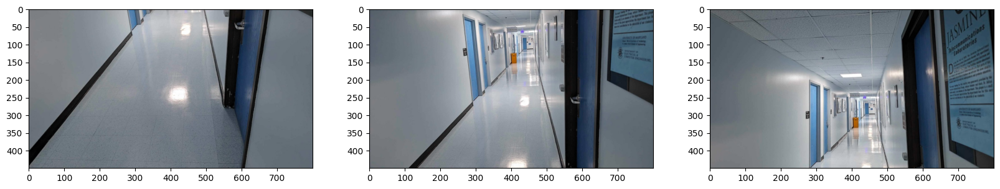

In [10]:
# plot custom set 2
fig, axes = plt.subplots(1, 3,figsize=(20, 20))
axes[0].imshow(custom2_image1)
axes[1].imshow(custom2_image2)
axes[2].imshow(custom2_image3)

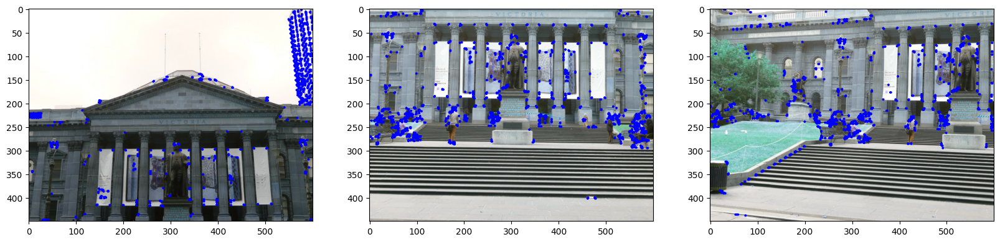

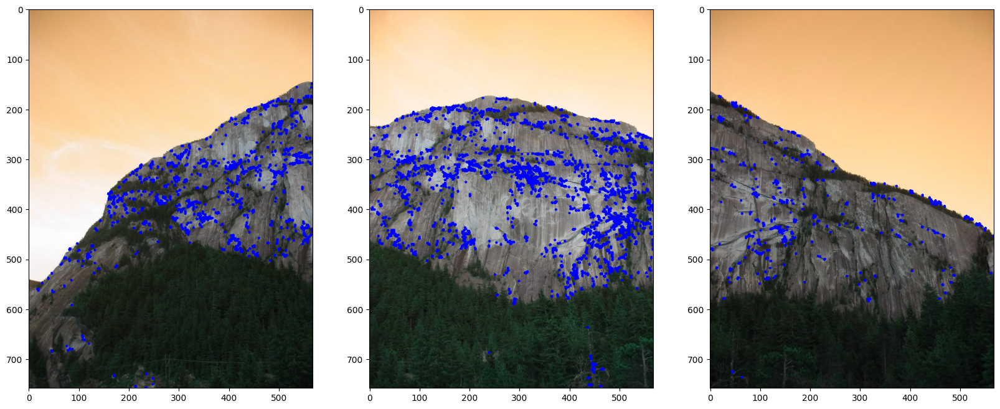

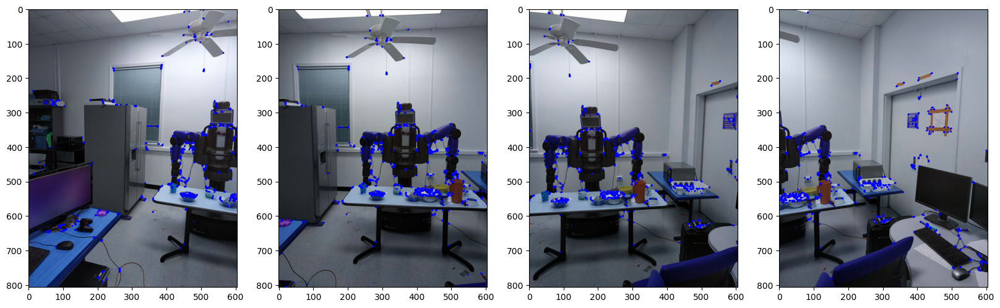

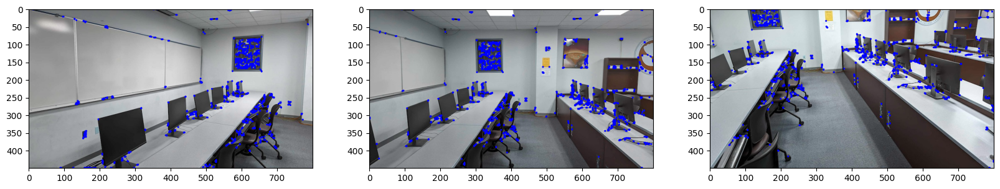

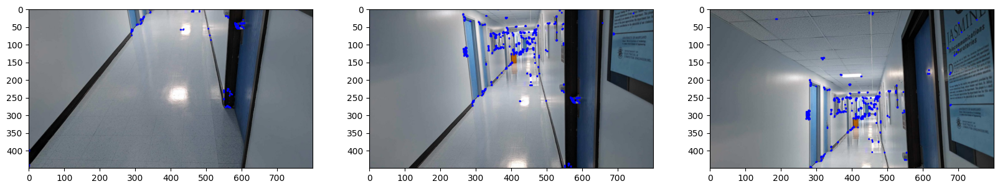

In [11]:
# perform corner detection
def get_corners(image_set):
    corners = []
    for image in image_set:
        corners.append(cv2.cornerHarris(image,2,7,0.07))
    return corners

set1_corners = get_corners(set1_gray)
set2_corners = get_corners(set2_gray)
set3_corners = get_corners(set3_gray)
custom1_corners = get_corners(custom1_gray)
custom2_corners = get_corners(custom2_gray)

# draw the corners detected
def display_corners(image_set, corners_set):
    fig, axes = plt.subplots(1,len(image_set),figsize=(20,20))
    for i in range(len(image_set)):
        copy = image_set[i].copy()
        threshold = 0.01 * corners_set[i].max()
        for j in range(copy.shape[0]):
            for k in range(copy.shape[1]):
                if corners_set[i][j,k] > threshold:
                    cv2.circle(copy,(k,j), 1, (0,0,255), 2)
        axes[i].imshow(copy)
    
# call function
display_corners(set1, set1_corners)
display_corners(set2, set2_corners)
display_corners(set3, set3_corners)
display_corners(custom1, custom1_corners)
display_corners(custom2, custom2_corners)

In [12]:
# ANMS
def anms(corners, N_best):
    # find the (x,y) coordinates of the local maximums using imregionalmax function
    regional = imregionalmax(corners)
    indices = np.where(regional == 1)
    local_maximums = np.array(list(zip(indices[0], indices[1])))
    Ys, Xs = local_maximums[:,0], local_maximums[:,1]
    N_strong = len(local_maximums)

    # initialize the distance list with length N_strong
    radius = np.full(N_strong, np.inf)
    
    for i in range(N_strong):
        # get a list of booleans where True will be the elements that suppresses this point
        suppressors = local_maximums[corners[(local_maximums[i][0], local_maximums[i][1])] < 0.9 * corners[(Ys,Xs)]] 
        distances = np.linalg.norm(suppressors - local_maximums[i], axis = 1)
        
        # once you get the list of booleans, where the value is true, use broadcasting to calculate dist
        if len(distances) == 0:
            radius[i] == np.inf
        else:
            radius[i] = min(distances)

    # find the N_best points
    indices = np.argsort(radius)[::-1][0:N_best]
    max_points = local_maximums[indices]
    return max_points

In [13]:
# get the n_best points for set1, set2, set3
set1_best = [anms(set1_corners[0],300), anms(set1_corners[1],300), anms(set1_corners[2], 300)]
print("Set 1 done")
set2_best = [anms(set2_corners[0],300), anms(set2_corners[1],300), anms(set2_corners[2], 300)]
print("Set 2 done")
set3_best = [anms(set3_corners[0],300), anms(set3_corners[1],300), anms(set3_corners[2], 300), anms(set3_corners[3],300)]
print("Set 3 done")
custom1_best = [anms(custom1_corners[0],300), anms(custom1_corners[1],300), anms(custom1_corners[2], 300)]
print("Custom 1 done")
custom2_best = [anms(custom2_corners[0],300), anms(custom2_corners[1],300), anms(custom2_corners[2], 300)]
print("Custom 2 done")

Set 1 done
Set 2 done
Set 3 done
Custom 1 done
Custom 2 done


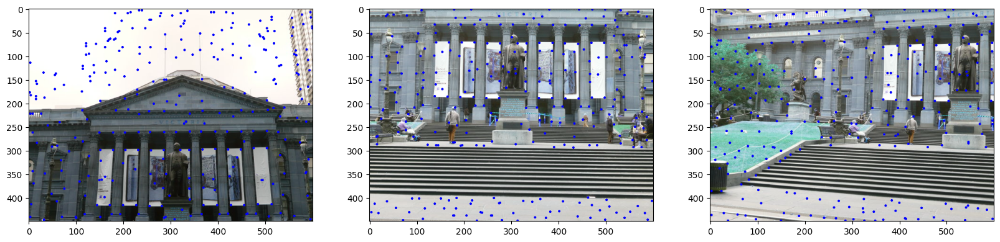

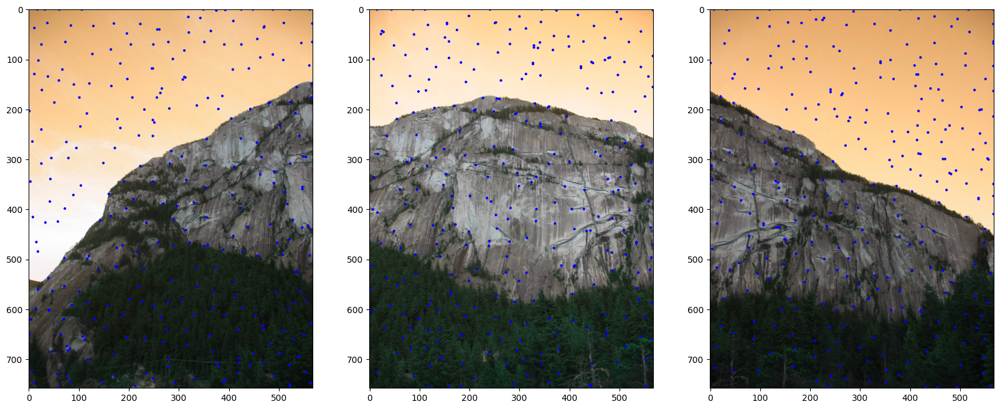

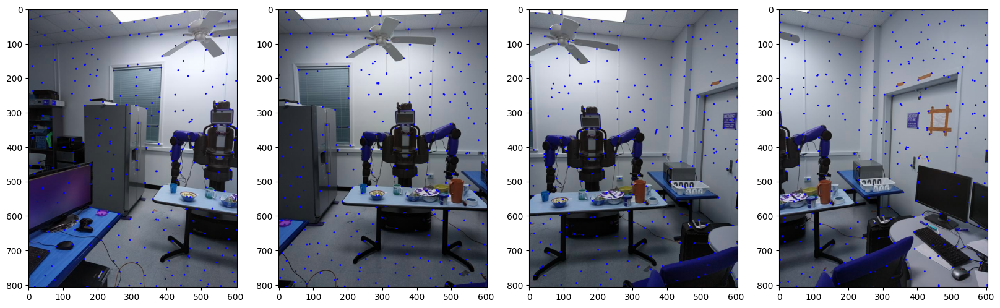

In [14]:
def draw_circles(image_set, best_points_set):
    fig, axes = plt.subplots(1,len(image_set),figsize=(20,20))
    for i in range(len(image_set)):
        copy = image_set[i].copy()
        best_points = best_points_set[i]
        for points in best_points:
            x,y = points[1], points[0]
            cv2.circle(copy, (x,y), 1, (0,0, 255), 2)
        axes[i].imshow(copy)

draw_circles(set1, set1_best)
draw_circles(set2, set2_best)
draw_circles(set3, set3_best)

In [15]:
# Feature Descriptor 

def feature_descriptor(candidate_points, f):
    features = []
    
    for p in candidate_points:
        # Step1: calculate the subpixel value 
        y, x = p[0],p[1]
        maxX, maxY = f.shape[1], f.shape[0]
        f_inv = 255 - f
        fx = (f[y, min(maxX-1, x+1)] - f[y, max(0,x-1)])//2
        fxx = f_inv[y, min(maxX-1,x+1)] + f_inv[y, max(0,x-1)] - (2*f_inv[y,x])
        fy = (f[max(0,y-1),x] - f[min(maxY-1,y+1),x])//2
        fyy = f_inv[max(0,y-1),x] + f_inv[min(maxY-1,y+1),x] - (2*f_inv[y,x])

        # new x,y coordinates with subpixel position
        x = round(x - (fxx * fx))
        y = round(y - (fyy * fy))

        # Step2: take a 40x40 window from subpixel position
        window = np.array(f[max(0,y-20):y+20, max(0,x-20):x+20])
        
        # 8 cases where padding is needed near the edges. Pad with zeros
        if window.shape[0] != 40 or window.shape[1] != 40:
            windowX, windowY = window.shape[1], window.shape[0]
            
            # case 1: left 
            if x < 20 and (y >= 20 and y <= maxY-20):
                pad_width = ((0,0),(40-windowX,0))
            # case 2: right
            elif (x > maxX-20) and (y >= 20 and y <= maxY-20):
                pad_width = ((0,0),(0,40-windowX))
            # case 3: top
            elif (y < 20) and (x >= 20 and x <= maxX-20):
                pad_width = ((40-windowY, 0),(0,0))
            # case 4: bottom 
            elif (y > maxY - 20) and (x >= 20 and x <= maxX - 20):
                pad_width = ((0, 40-windowY),(0,0))
            # case 5: top left
            elif x < 20 and y < 20:
                pad_width = ((40-windowY,0),(40-windowX,0))       
            # case 6: top right
            elif x > maxX - 20 and y < 20:
                pad_width = ((40-windowY,0),(0,40-windowX))       
            # case 7: bottom left
            elif x < 20 and y > maxY - 20:
                pad_width = ((0,40-windowY),(40-windowX,0))         
            # case 8: bottom right
            elif x > maxX - 20 and y > maxY - 20:
                pad_width = ((0,40-windowY),(0,40-windowX))

            # pad the window with the according pad_width
            window = np.pad(window, pad_width, mode='constant', constant_values=0)
       
        # Step 3: Gaussian Blur the 40x40 window
        blurred_window = cv2.GaussianBlur(window,(3,3),0)

        # Step 4: subsample it with spacing of 5
        sub_sampled = blurred_window[::5,::5] 

        # Step 5: reshape it into a 64x1 vector
        feature = sub_sampled.flatten()
        # print(feature)
        # print(feature.mean())
        # print(feature.std())
        # Step 6: standardize it
        feature = (feature - feature.mean())/feature.std()
        # print(feature)
        # print(round(feature.mean()), feature.std())
        features.append(feature)
    
    return np.array(features)

In [16]:
# create features for the image sets.                        
set1_features = [feature_descriptor(set1_best[0], set1_gray[0]/255),
                 feature_descriptor(set1_best[1], set1_gray[1]/255),
                 feature_descriptor(set1_best[2], set1_gray[2]/255)]

set2_features = [feature_descriptor(set2_best[0], set2_gray[0]/255),
                 feature_descriptor(set2_best[1], set2_gray[1]/255),
                 feature_descriptor(set2_best[2], set2_gray[2]/255)]

set3_features = [feature_descriptor(set3_best[0], set3_gray[0]/255),
                 feature_descriptor(set3_best[1], set3_gray[1]/255),
                 feature_descriptor(set3_best[2], set3_gray[2]/255),
                 feature_descriptor(set3_best[3], set3_gray[3]/255)]                            

custom1_features = [feature_descriptor(custom1_best[0], custom1_gray[0]/255),
                    feature_descriptor(custom1_best[1], custom1_gray[1]/255),
                    feature_descriptor(custom1_best[2], custom1_gray[2]/255)]

custom2_features = [feature_descriptor(custom2_best[0], custom2_gray[0]/255),
                    feature_descriptor(custom2_best[1], custom2_gray[1]/255),
                    feature_descriptor(custom2_best[2], custom2_gray[2]/255)]

In [17]:
def feature_matching(image1,kp1,feature1,image2,kp2,feature2):
    '''
    image1 -> first image. Used to draw graphs using helper code
    kp1 -> indexes of the N-best feature points
    feature1 -> List of length N with 64x1 features as individual elements
    '''
    matching_pairs = []
    ret = []
    # Find matching pairs
    for i in range(len(feature1)):
        vector1 = feature1[i]
        ssds = []
        for j in range(len(feature2)):
            # calculate SSD
            vector2 = feature2[j]
            ssds.append(np.sum(np.square(vector1-vector2)))
                        
        # From the feature in image1, find the matching feature (shortest distance)
        # in the second image
        indices = np.argsort(ssds)

        # take the ratio of the best match and second match.
        best, second_best = indices[0], indices[1]
        ratio = ssds[best]/ssds[second_best]

        # set a threshold to obtain only points that are distinct 
        if ratio < 0.5:
            matching_pairs.append([i,best])
            ret.append([[kp1[i][1],kp1[i][0]],[kp2[best][1],kp2[best][0]]])
            
    image = drawMatches(image1,kp1,image2,kp2,np.array(matching_pairs))
    plt.imshow(image)
    return np.array(ret)

array([[[281, 418],
        [274, 189]],

       [[398, 416],
        [386, 189]],

       [[178, 299],
        [168,  71]],

       [[573, 283],
        [569,  58]],

       [[362,  52],
        [235, 431]],

       [[ 60, 290],
        [ 48,  58]],

       [[320, 299],
        [313,  73]],

       [[160, 399],
        [154, 170]],

       [[455, 416],
        [442, 190]],

       [[171, 416],
        [165, 186]],

       [[424, 355],
        [414, 130]],

       [[231, 299],
        [222,  71]],

       [[492, 363],
        [ 11, 413]],

       [[599,  41],
        [598, 153]],

       [[540, 349],
        [529, 128]],

       [[225, 340],
        [216, 112]],

       [[369, 379],
        [359, 154]],

       [[277,  15],
        [567, 418]],

       [[114, 281],
        [103,  52]],

       [[537, 394],
        [523, 171]],

       [[542, 277],
        [537,  55]],

       [[290, 350],
        [282, 122]],

       [[  4, 183],
        [  4, 431]],

       [[484, 414],
        [470, 

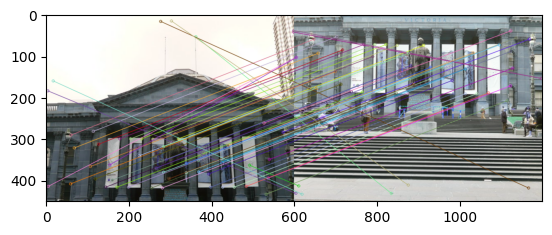

In [18]:
feature_matching(set1[0],set1_best[0],set1_features[0],set1[1],set1_best[1],set1_features[1])

array([[[ 61, 261],
        [295, 265]],

       [[274, 189],
        [504, 195]],

       [[ 48,  58],
        [284,  70]],

       [[ 71, 448],
        [303, 446]],

       [[113, 445],
        [414, 445]],

       [[361, 403],
        [498, 413]],

       [[222,  71],
        [450,  76]],

       [[313,  73],
        [547,  74]],

       [[168,  71],
        [396,  78]],

       [[346, 282],
        [583, 293]],

       [[259, 281],
        [490, 289]],

       [[ 25, 233],
        [262, 238]],

       [[330, 154],
        [565, 158]],

       [[373, 443],
        [473, 442]],

       [[216, 112],
        [444, 118]],

       [[248,  33],
        [477,  37]],

       [[539, 443],
        [473, 442]],

       [[138,  33],
        [367,  42]],

       [[  3, 140],
        [  3,  80]],

       [[103,  52],
        [333,  62]],

       [[331, 210],
        [567, 211]],

       [[ 90, 402],
        [325, 403]],

       [[ 99, 137],
        [329, 145]],

       [[466, 138],
        [365, 

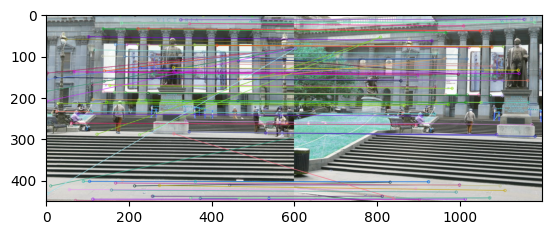

In [19]:
feature_matching(set1[1],set1_best[1],set1_features[1],set1[2],set1_best[2],set1_features[2])

array([[[223, 314],
        [ 55, 220]],

       [[343,  18],
        [300,  15]],

       [[567,  29],
        [567,  94]],

       [[490, 734],
        [ 88, 734]],

       [[438, 436],
        [ 82, 431]],

       [[490, 348],
        [148, 352]],

       [[449, 689],
        [ 54, 688]],

       [[106,   1],
        [111,   1]],

       [[508, 491],
        [142, 495]],

       [[521, 712],
        [122, 713]],

       [[522, 753],
        [118, 754]],

       [[567,  66],
        [567,  94]],

       [[547, 360],
        [201, 374]],

       [[536, 524],
        [164, 531]],

       [[409, 454],
        [ 49, 444]],

       [[419, 642],
        [ 30, 637]],

       [[470, 639],
        [ 83, 638]],

       [[407, 372],
        [ 61, 361]],

       [[  7, 265],
        [  8, 100]],

       [[ 17,   0],
        [ 15,   0]],

       [[561, 113],
        [558, 135]],

       [[ 17,   1],
        [ 15,   1]],

       [[146, 746],
        [359, 746]],

       [[511, 366],
        [165, 

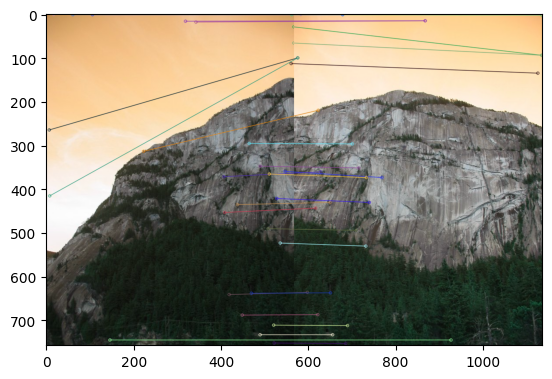

In [20]:
feature_matching(set2[0],set2_best[0],set2_features[0],set2[1],set2_best[1],set2_features[1])

array([[[370, 290],
        [ 39, 287]],

       [[567,   2],
        [567,   1]],

       [[484, 223],
        [167, 246]],

       [[409, 514],
        [ 40, 521]],

       [[411, 513],
        [ 40, 521]],

       [[486, 523],
        [117, 539]],

       [[111,   0],
        [119,   0]],

       [[111,   1],
        [119,   1]],

       [[260, 180],
        [327, 351]],

       [[476, 483],
        [113, 499]],

       [[406, 570],
        [ 28, 579]],

       [[371, 387],
        [ 22, 386]],

       [[434, 444],
        [ 78, 454]],

       [[470, 610],
        [ 88, 625]],

       [[567,  94],
        [567, 114]],

       [[300,  15],
        [449,  15]],

       [[495,   6],
        [287,   5]],

       [[486, 419],
        [133, 437]],

       [[477, 340],
        [138, 358]],

       [[558, 135],
        [557, 301]]])

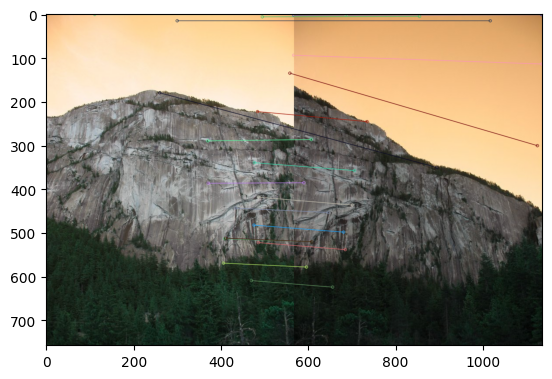

In [21]:
feature_matching(set2[1],set2_best[1],set2_features[1],set2[2],set2_best[2],set2_features[2])

array([[[465,  52],
        [265,  63]],

       [[545, 275],
        [351, 281]],

       [[386, 515],
        [214, 518]],

       [[260, 595],
        [ 72, 617]],

       [[144,   7],
        [587,   6]],

       [[247, 179],
        [ 58, 176]],

       [[565, 128],
        [364, 143]],

       [[592, 415],
        [401, 408]],

       [[420, 369],
        [243, 371]],

       [[541, 527],
        [357, 516]],

       [[575, 189],
        [380, 248]],

       [[118,   9],
        [587,   6]],

       [[ 11, 166],
        [ 11, 756]],

       [[311, 281],
        [128, 284]],

       [[373, 340],
        [201, 343]],

       [[592, 764],
        [593, 623]],

       [[586, 468],
        [398, 457]],

       [[380, 257],
        [203, 259]],

       [[103, 534],
        [ 22, 119]],

       [[262, 657],
        [ 90, 682]],

       [[138, 174],
        [ 22, 119]],

       [[315, 467],
        [143, 477]],

       [[361, 551],
        [185, 559]],

       [[484,  91],
        [286, 

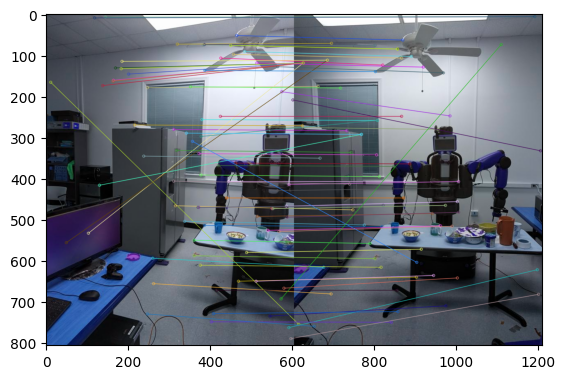

In [22]:
feature_matching(set3[0],set3_best[0],set3_features[0],set3[1],set3_best[1],set3_features[1])

array([[[313, 189],
        [117, 193]],

       [[313, 187],
        [117, 193]],

       [[270, 408],
        [ 78, 421]],

       [[282, 676],
        [ 90, 705]],

       [[265,  63],
        [ 60,  58]],

       [[458, 526],
        [267, 532]],

       [[351, 281],
        [160, 290]],

       [[282, 795],
        [137, 795]],

       [[604, 289],
        [604, 101]],

       [[393, 335],
        [207, 346]],

       [[568, 531],
        [369, 528]],

       [[357, 516],
        [167, 530]],

       [[492, 686],
        [303, 685]],

       [[508, 479],
        [318, 483]],

       [[364, 143],
        [173, 153]],

       [[489, 369],
        [299, 379]],

       [[339, 346],
        [150, 356]],

       [[ 10, 428],
        [ 10, 701]],

       [[398, 457],
        [214, 467]],

       [[506, 755],
        [315, 748]],

       [[143,  30],
        [175,  31]],

       [[243, 371],
        [ 48, 383]],

       [[286, 103],
        [ 85, 103]],

       [[601, 333],
        [601, 

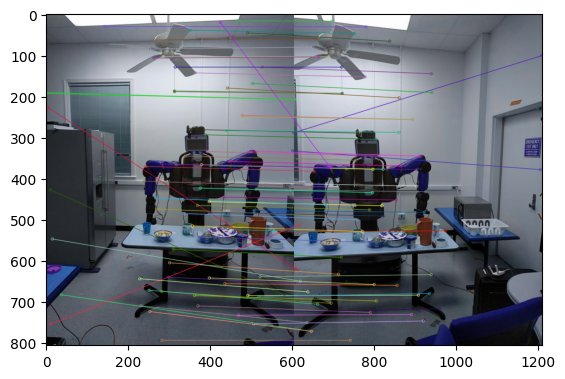

In [23]:
feature_matching(set3[1],set3_best[1],set3_features[1],set3[2],set3_best[2],set3_features[2])

array([[[409, 502],
        [231, 497]],

       [[554, 210],
        [362, 214]],

       [[461,  48],
        [278,  49]],

       [[267, 532],
        [ 75, 537]],

       [[468, 632],
        [279, 621]],

       [[217, 419],
        [ 21, 418]],

       [[575, 464],
        [383, 453]],

       [[299, 379],
        [115, 373]],

       [[  4, 261],
        [  0, 192]],

       [[499, 386],
        [512, 400]],

       [[586, 765],
        [367, 728]],

       [[189,  72],
        [ 68,  51]],

       [[303, 685],
        [119, 694]],

       [[437, 734],
        [253, 713]],

       [[417,  95],
        [239,  91]],

       [[488, 251],
        [305, 249]],

       [[287, 587],
        [ 99, 593]],

       [[214, 467],
        [ 19, 471]],

       [[335, 562],
        [149, 564]],

       [[369, 528],
        [188, 526]],

       [[453, 518],
        [273, 509]],

       [[413, 141],
        [237, 124]],

       [[356,   5],
        [132,   5]],

       [[402, 623],
        [228, 

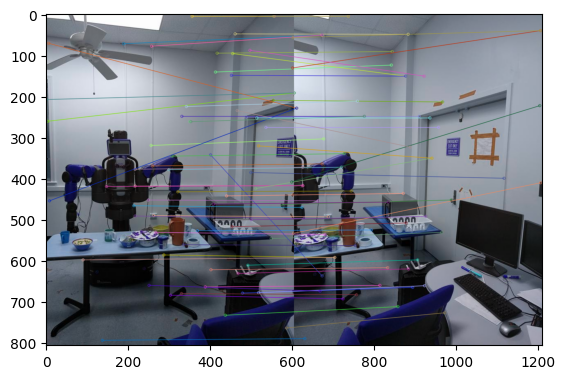

In [24]:
feature_matching(set3[2],set3_best[2],set3_features[2],set3[3],set3_best[3],set3_features[3])

array([[[663, 246],
        [385, 242]],

       [[375,  86],
        [ 74,  77]],

       [[529,  29],
        [251,  30]],

       [[471, 291],
        [203, 302]],

       [[557, 221],
        [289, 224]],

       [[614, 322],
        [346, 316]],

       [[786, 428],
        [788,  46]],

       [[ 18, 413],
        [ 17, 215]],

       [[784, 429],
        [788,  46]],

       [[317, 280],
        [166, 259]],

       [[393, 264],
        [106, 281]],

       [[413, 448],
        [174, 447]],

       [[393, 325],
        [109, 350]],

       [[615, 167],
        [340, 171]],

       [[799, 190],
        [799, 285]],

       [[270,   0],
        [ 66,   0]],

       [[270,   1],
        [ 66,   1]],

       [[441, 249],
        [166, 259]],

       [[619,   7],
        [285,   9]],

       [[615, 240],
        [343, 239]],

       [[  5, 234],
        [  5, 157]],

       [[648, 125],
        [367, 132]],

       [[735, 100],
        [151,  63]],

       [[492,  66],
        [214, 

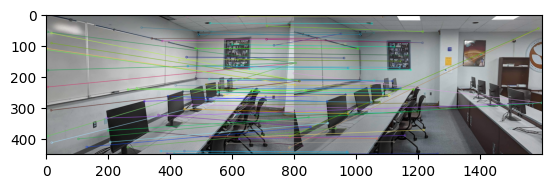

In [25]:
feature_matching(custom1[0],custom1_best[0],custom1_features[0],custom1[1],custom1_best[1],custom1_features[1])

array([[[690, 288],
        [518, 147]],

       [[385, 242],
        [223, 124]],

       [[  0, 308],
        [  0,  24]],

       [[706, 371],
        [531, 221]],

       [[346, 316],
        [185, 206]],

       [[586, 237],
        [427, 106]],

       [[646, 418],
        [483, 268]],

       [[106, 281],
        [634,  64]],

       [[488, 179],
        [328,  50]],

       [[598, 166],
        [436,  33]],

       [[542, 409],
        [393, 273]],

       [[779, 361],
        [590, 205]],

       [[546, 167],
        [385,  35]],

       [[467, 281],
        [316, 159]],

       [[753, 166],
        [574,  28]],

       [[530, 246],
        [376, 119]],

       [[494, 349],
        [346, 223]],

       [[285,   9],
        [325,   7]],

       [[664, 261],
        [497, 124]],

       [[687, 232],
        [518,  95]],

       [[591, 282],
        [432, 150]],

       [[632, 223],
        [467,  89]],

       [[261, 154],
        [ 88,  30]],

       [[363, 286],
        [201, 

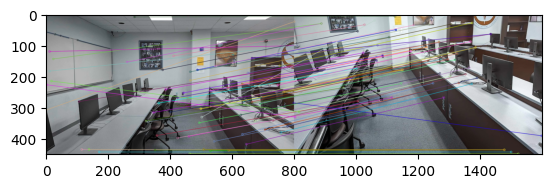

In [26]:
feature_matching(custom1[1],custom1_best[1],custom1_features[1],custom1[2],custom1_best[2],custom1_features[2])

array([[[289,  65],
        [291, 264]],

       [[322,  27],
        [324, 231]],

       [[583,  46],
        [570, 257]],

       [[496, 438],
        [279, 436]],

       [[ 90,   5],
        [119,   5]],

       [[ 83,   5],
        [119,   5]],

       [[459,   8],
        [ 23,   8]],

       [[563, 448],
        [242, 447]],

       [[674, 449],
        [707, 449]],

       [[ 98, 446],
        [242, 447]],

       [[506,  56],
        [498, 260]],

       [[428,  59],
        [425, 261]],

       [[499, 156],
        [496, 363]],

       [[  2,  24],
        [  1, 192]],

       [[300, 151],
        [294, 349]],

       [[555,  21],
        [542, 232]],

       [[447, 158],
        [443, 359]],

       [[333, 446],
        [242, 447]],

       [[594, 438],
        [627, 439]],

       [[597,  93],
        [587, 301]],

       [[762,  31],
        [700, 243]],

       [[798,  18],
        [444, 429]],

       [[795,  59],
        [546, 181]],

       [[412, 442],
        [770, 

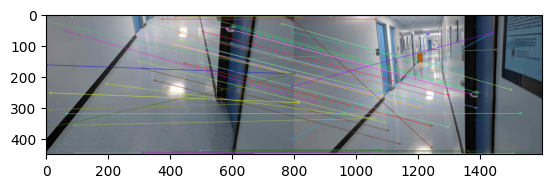

In [27]:
feature_matching(custom2[0],custom2_best[0],custom2_features[0],custom2[1],custom2_best[1],custom2_features[1])

array([[[447,  95],
        [451, 279]],

       [[267, 133],
        [272, 310]],

       [[324, 231],
        [320, 416]],

       [[731, 232],
        [695, 409]],

       [[366,  73],
        [373, 255]],

       [[453, 216],
        [457, 405]],

       [[399, 155],
        [402, 336]],

       [[528,  89],
        [529, 279]],

       [[ 14, 284],
        [ 14,  59]],

       [[454, 189],
        [458, 375]],

       [[498, 260],
        [492, 406]],

       [[755, 130],
        [747, 331]],

       [[309,  39],
        [322, 223]],

       [[406,  74],
        [411, 258]],

       [[503,  41],
        [504, 233]],

       [[336, 106],
        [342, 286]],

       [[588, 196],
        [594, 389]],

       [[543, 144],
        [545, 332]],

       [[422, 128],
        [426, 310]],

       [[329, 157],
        [331, 336]],

       [[730, 194],
        [746, 400]],

       [[542, 232],
        [545, 332]],

       [[775, 212],
        [746, 400]],

       [[776, 254],
        [716, 

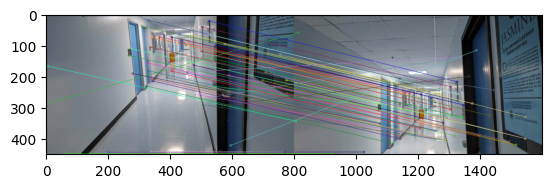

In [28]:
feature_matching(custom2[1],custom2_best[1],custom2_features[1],custom2[2],custom2_best[2],custom2_features[2])

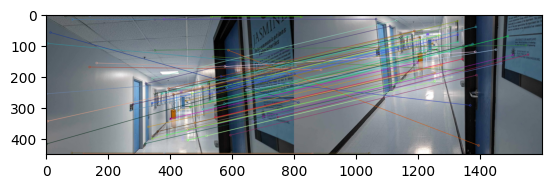

In [29]:
# store all the matching pairs
set1_one = feature_matching(set1[0],set1_best[0],set1_features[0],set1[1],set1_best[1],set1_features[1])
set1_two = feature_matching(set1[2],set1_best[2],set1_features[2],set1[1],set1_best[1],set1_features[1])
set1_matching = [set1_one,set1_two]

set2_one = feature_matching(set2[0],set2_best[0],set2_features[0],set2[1],set2_best[1],set2_features[1])
set2_two = feature_matching(set2[2],set2_best[2],set2_features[2],set2[1],set2_best[1],set2_features[1])
set2_matching = [set2_one, set2_two]

set3_one = feature_matching(set3[0],set3_best[0],set3_features[0],set3[1],set3_best[1],set3_features[1])
set3_two = feature_matching(set3[2],set3_best[2],set3_features[2],set3[1],set3_best[1],set3_features[1])
set3_three = feature_matching(set3[3],set3_best[3],set3_features[3],set3[1],set3_best[1],set3_features[1])
set3_matching = [set3_one, set3_two, set3_three]

custom1_one = feature_matching(custom1[0],custom1_best[0],custom1_features[0],custom1[1],custom1_best[1],custom1_features[1])
custom1_two = feature_matching(custom1[2],custom1_best[2],custom1_features[2],custom1[1],custom1_best[1],custom1_features[1])
custom1_matching = [custom1_one, custom1_two]

custom2_one = feature_matching(custom2[0],custom2_best[0],custom2_features[0],custom2[1],custom2_best[1],custom2_features[1])
custom2_two = feature_matching(custom2[2],custom2_best[2],custom2_features[2],custom2[1],custom2_best[1],custom2_features[1])
custom2_matching = [custom2_one, custom2_two]

In [30]:
# Let's separate the matching pairs into two lists: one for the first image and one for the second image
def separate_pairs(matching_pairs):
    first_image = []
    second_image = []
    for pairs in matching_pairs:
        first_image.append(pairs[0])
        second_image.append(pairs[1])
    return np.array(first_image), np.array(second_image)

# get all the x,y coordinates separated
set1_one_first, set1_one_second = separate_pairs(set1_one)
set1_two_first, set1_two_second = separate_pairs(set1_two)

set2_one_first, set2_one_second = separate_pairs(set2_one)
set2_two_first, set2_two_second = separate_pairs(set2_two)

set3_one_first, set3_one_second = separate_pairs(set3_one)
set3_two_first, set3_two_second = separate_pairs(set3_two)
set3_three_first, set3_three_second = separate_pairs(set3_three)

custom1_one_first, custom1_one_second = separate_pairs(custom1_one)
custom1_two_first, custom1_two_second = separate_pairs(custom1_two)

custom2_one_first, custom2_one_second = separate_pairs(custom2_one)
custom2_two_first, custom2_two_second = separate_pairs(custom2_two)

In [31]:
# RANSAC
def ransac(p1, p2, N_max, threshold):
    max_inliers = []
    H_hat = None
    
    for i in range(N_max):
        # Step 1: Select 4 random points
        indices = np.random.choice(len(p1), 4, replace=False)
        src = p1[indices]
        dest = p2[indices]
        
        # Step 2: Compute homography
        H = est_homography(src, dest)

        # Step 3: Apply homography to all points
        dest2 = apply_homography(H, p1)
        
        # Step 4: Calculate distance between dest2 and p2
        distances = np.linalg.norm(p2 - dest2, axis=1)

        # Step 5: Find inliers
        inliers = np.where(distances < threshold)[0]
        
        # Step 6: Keep the largest set of inliers
        if len(inliers) > len(max_inliers):
            max_inliers = inliers
            H_hat = est_homography(p1[inliers], p2[inliers])

    # return both coordinate pairs and matrix pairs so that we can use the matrix 
    # pairs to see if the RANSAC Algorithm worked using the drawMatches function provided
    coordinate_pairs = np.array([[p1[i], p2[i]] for i in max_inliers])
    matrix_pairs = np.array([[[p1[i][1],p1[i][0]], [p2[i][1],p2[i][0]]] for i in max_inliers])
    return H_hat, coordinate_pairs, matrix_pairs

# Ransac return values for set1
set1_homography1, set1_coords1, set1_matrix_coords1 = ransac(set1_one_first, set1_one_second, 500, 5)
set1_homography2, set1_coords2, set1_matrix_coords2 = ransac(set1_two_first, set1_two_second, 500, 5)

# Ransac return values for set2
set2_homography1, set2_coords1, set2_matrix_coords1 = ransac(set2_one_first, set2_one_second, 500, 5)
set2_homography2, set2_coords2, set2_matrix_coords2 = ransac(set2_two_first, set2_two_second, 500, 5)

# Ransac return values for set3
set3_homography1, set3_coords1, set3_matrix_coords1 = ransac(set3_one_first, set3_one_second, 500, 5)
set3_homography2, set3_coords2, set3_matrix_coords2 = ransac(set3_two_first, set3_two_second, 500, 5)
set3_homography3, set3_coords3, set3_matrix_coords3 = ransac(set3_three_first, set3_three_second, 500, 5)

# Ransac return values for custom1
custom1_homography1, custom1_coords1, custom1_matrix_coords1 = ransac(custom1_one_first, custom1_one_second, 500, 5)
custom1_homography2, custom1_coords2, custom1_matrix_coords2 = ransac(custom1_two_first, custom1_two_second, 500, 5)

# Ransac return values for custom2
custom2_homography1, custom2_coords1, custom2_matrix_coords1 = ransac(custom2_one_first, custom2_one_second, 500, 5)
custom2_homography2, custom2_coords2, custom2_matrix_coords2 = ransac(custom2_two_first, custom2_two_second, 500, 5)

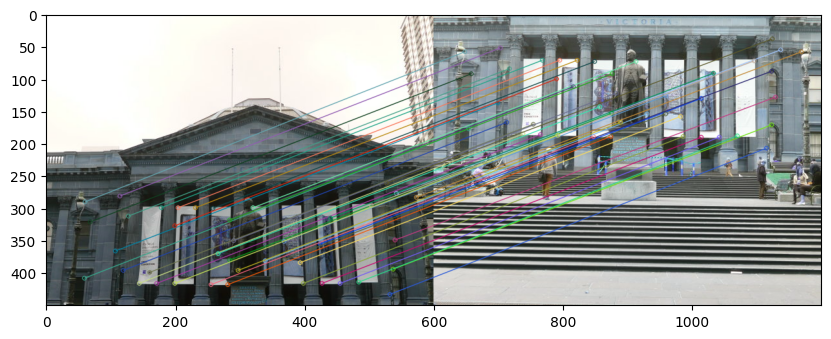

In [32]:
# Graphing the matching pairs after running RANSAC

# image set 1 (from image1 to image2)
kp1,kp2 = separate_pairs(set1_matrix_coords1)
image = drawMatches(set1[0],kp1,set1[1],kp2,np.array([[i,i] for i in range(len(kp1))]))
plt.figure(figsize=(10,8))
plt.imshow(image)

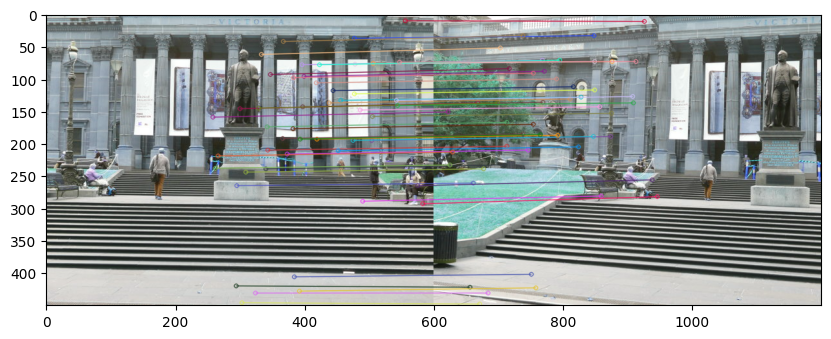

In [33]:
# image set 1 (from image2 to image3)
kp1,kp2 = separate_pairs(set1_matrix_coords2)
image = drawMatches(set1[1],kp1,set1[2],kp2,np.array([[i,i] for i in range(len(kp1))]))
plt.figure(figsize=(10,8))
plt.imshow(image)

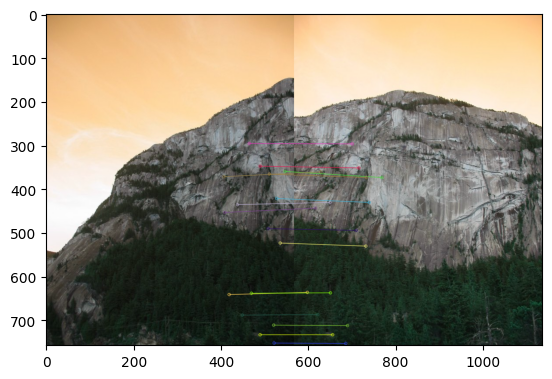

In [34]:
# image set 2 (from image1 to image2)
kp1,kp2 = separate_pairs(set2_matrix_coords1)
image = drawMatches(set2[0],kp1,set2[1],kp2,np.array([[i,i] for i in range(len(kp1))]))
plt.imshow(image)

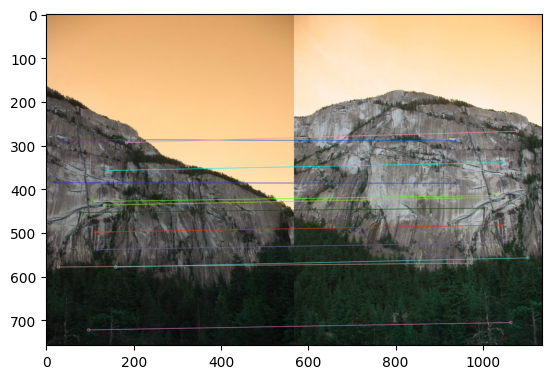

In [35]:
# image set 2 (from image2 to image3)
kp1,kp2 = separate_pairs(set2_matrix_coords2)
image = drawMatches(set2[2],kp1,set2[1],kp2,np.array([[i,i] for i in range(len(kp1))]))
plt.imshow(image)

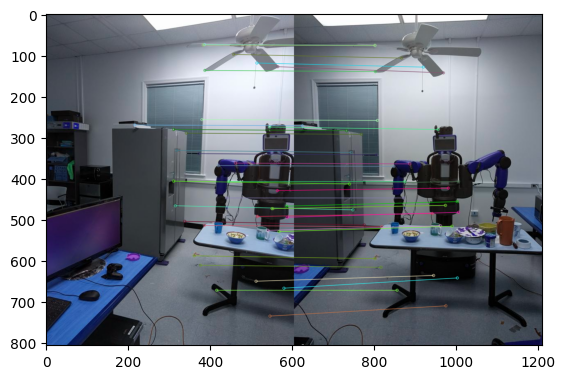

In [36]:
# image set 3 (from image1 to image2)
kp1,kp2 = separate_pairs(set3_matrix_coords1)

image = drawMatches(set3[0],kp1,set3[1],kp2,np.array([[i,i] for i in range(len(kp1))]))
plt.imshow(image)

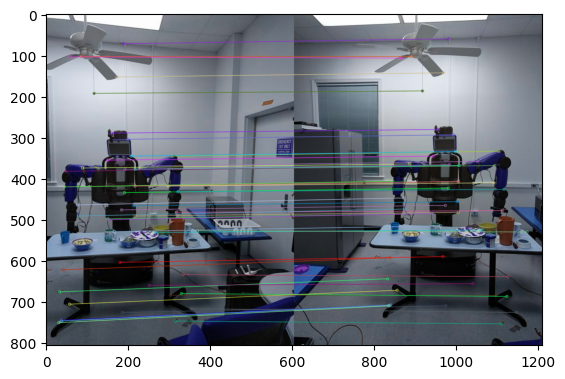

In [37]:
# image set 3 (from image2 to image3)
kp1,kp2 = separate_pairs(set3_matrix_coords2)
image = drawMatches(set3[2],kp1,set3[1],kp2,np.array([[i,i] for i in range(len(kp1))]))
plt.imshow(image)

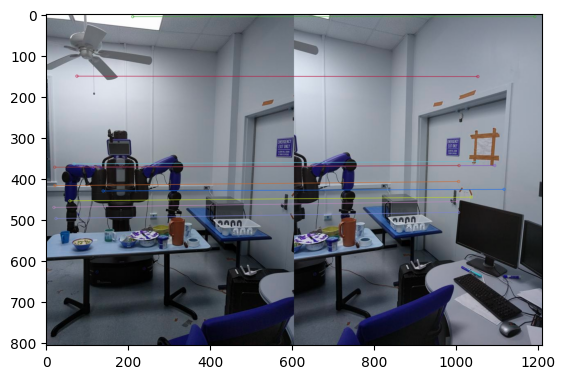

In [38]:
# image set 3 (from image3 to image4)
kp1,kp2 = separate_pairs(set3_matrix_coords3)
image = drawMatches(set3[2],kp1,set3[3],kp2,np.array([[i,i] for i in range(len(kp1))]))
plt.imshow(image)

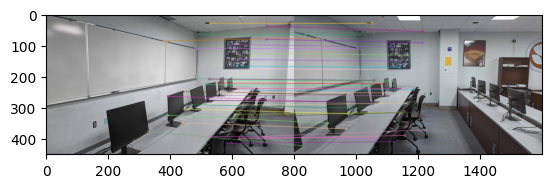

In [39]:
# custom set 1 (from image1 to image2)
kp1,kp2 = separate_pairs(custom1_matrix_coords1)
image = drawMatches(custom1[0],kp1,custom1[1],kp2,np.array([[i,i] for i in range(len(kp1))]))
plt.imshow(image)

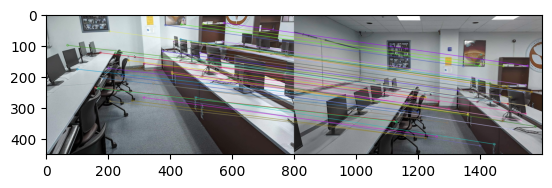

In [40]:
# custom set 1 (from image2 to image3)
kp1,kp2 = separate_pairs(custom1_matrix_coords2)
image = drawMatches(custom1[2],kp1,custom1[1],kp2,np.array([[i,i] for i in range(len(kp1))]))
plt.imshow(image)

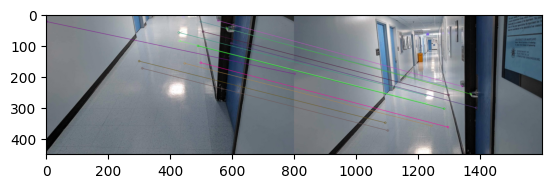

In [41]:
# custom set 2 (from image1 to image2)
kp1,kp2 = separate_pairs(custom2_matrix_coords1)
image = drawMatches(custom2[0],kp1,custom2[1],kp2,np.array([[i,i] for i in range(len(kp1))]))
plt.imshow(image)

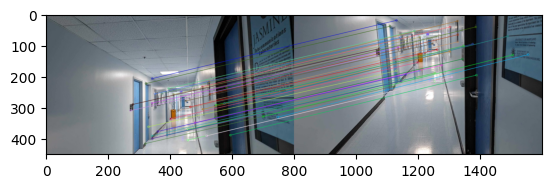

In [42]:
# custom set 2 (from image2 to image3)
kp1,kp2 = separate_pairs(custom2_matrix_coords2)
image = drawMatches(custom2[2],kp1,custom2[1],kp2,np.array([[i,i] for i in range(len(kp1))]))
plt.imshow(image)

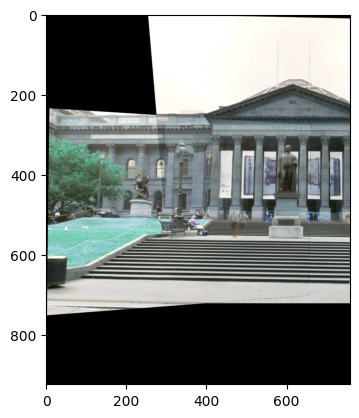

In [43]:
def get_corners(image):
    return np.array([[0,0],[0,image.shape[1]],[image.shape[0],0],[image.shape[0],image.shape[1]]])

def get_bounding_box(image, H):
    corners = get_corners(image)
    transformed_corners = apply_homography(H, corners)
    min_x, min_y = np.min(transformed_corners, axis=0)
    max_x, max_y = np.max(transformed_corners, axis=0)
    return min_x, min_y, max_x, max_y

def get_canvas_size(images, homographies):
    min_x, min_y, max_x, max_y = get_bounding_box(images[0], homographies[0])
    for i in range(1, len(images)):
        x1, y1, x2, y2 = get_bounding_box(images[i], homographies[i])
        min_x = min(min_x, x1)
        min_y = min(min_y, y1)
        max_x = max(max_x, x2)
        max_y = max(max_y, y2)
    return min_x, min_y, max_x, max_y

def get_translation_matrix(min_x, min_y):
    return np.array([[1, 0, -min_x], [0, 1, -min_y], [0, 0, 1]])

def create_panorama(images, homographies, name):
    min_x, min_y, max_x, max_y = get_canvas_size(images, homographies)
    translation_matrix = get_translation_matrix(min_x, min_y)
    canvas_width = int(max_x - min_x)
    canvas_height = int(max_y - min_y)
    canvas = np.zeros((canvas_height, canvas_width, 3), dtype=np.uint8)
    for i in range(len(images)):
        image = images[i]
        homography = homographies[i]
        transformed_image = cv2.warpPerspective(image, translation_matrix @ homography, (canvas_width, canvas_height))
        for x in range(transformed_image.shape[0]):
            for y in range(transformed_image.shape[1]):
                if np.any(transformed_image[x, y] != 0):
                    if np.any(canvas[x, y] == 0):
                        canvas[x, y] = transformed_image[x, y]
                    else:
                        canvas[x, y] = np.mean([canvas[x, y], transformed_image[x, y]], axis=0)
    cv2.imwrite(f"../images/input/{name}_panorama.jpg", canvas)
    return canvas

# create the panorama for set1
panorama1 = create_panorama(set1, [set1_homography1, np.eye(3), set1_homography2], "set1")
plt.imshow(panorama1)

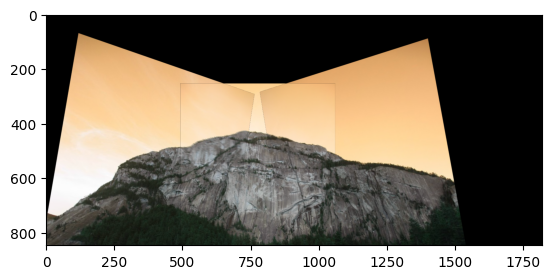

In [44]:
panorama2 = create_panorama(set2, [set2_homography1, np.eye(3), set2_homography2], "set2")
plt.imshow(panorama2)

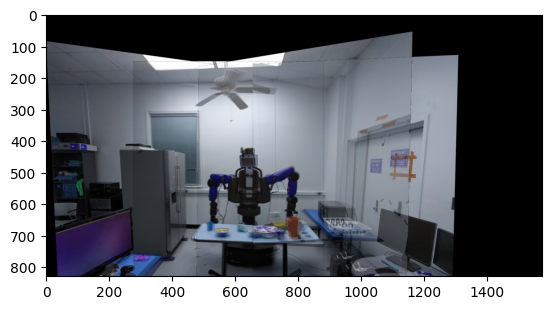

In [45]:
panorama3 = create_panorama(set3, [set3_homography1, np.eye(3), set3_homography2, set3_homography3], "set3")
plt.imshow(panorama3)

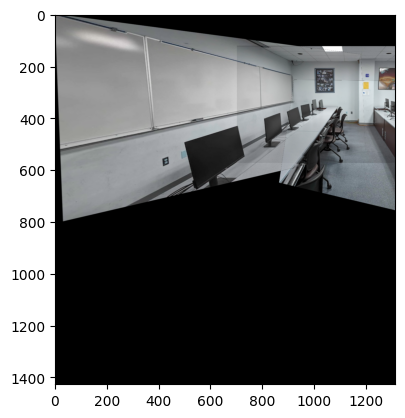

In [49]:
panorama4 = create_panorama(custom1, [custom1_homography1, np.eye(3), custom1_homography2], "custom1")
plt.imshow(panorama4)

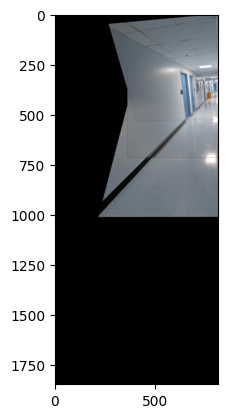

In [50]:
panorama5 = create_panorama(custom2, [custom2_homography1, np.eye(3), custom2_homography2], "custom2")
plt.imshow(panorama5)